# Online Shoppers Predictive Analysis Final Report

## Group 24

**Members:**  
Andrew Liu, Audra Cornick, Haoxi Jiang, Nazia Chowdhury

#### STAT 301 - 5th December 2025

In [1]:
library(tidyverse)
library(car)       
library(glmnet)     
library(caret)      
library(readr)
library(dplyr)
library(broom)
library(cowplot)
library(ggplot2)
library(patchwork)
library(gridExtra)
library(ggpubr)
library(pROC)
library(reshape2)
library(tibble)
library(ggtext)
library(ggplotify)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4.1-8

Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:pu

## Introduction

In the e-commerce industry, being able to predict whether a customer is likely to make a purchase is essential for designing effective recommendation systems, targeted marketing strategies, and personalized user experiences (Ding et al., 2015; Rajamma et al., 2009). Unlike in physical retail settings where sales associates can rely on experience, intuition, and real-time interactions to guide customers, online platforms must rely entirely on algorithmic decision-making (Moe, 2003). This creates a strong need for data-driven models that can identify which aspects of a user’s browsing behaviour are most informative for predicting the likelihood of a purchase.

Online shopping datasets often contain many behavioural, timing, and session-related variables, which can complicate traditional regression modeling due to multicollinearity and the inclusion of weak or redundant predictors. Logistic regression remains a standard, interpretable approach for predicting binary outcomes, while regularization techniques such as ridge regression can provide additional stability and improve predictive performance in the presence of multiple correlated variables.

**The guiding research question of this project is:**
 - Can we build a session-level predictive model that accurately classifies whether an online browsing session will end in a purchase, using information on on-site behaviour, timing, and user/traffic characteristics?
 
Because the data come from naturally occurring online browsing sessions rather than a controlled experiment, it is not possible to draw causal conclusions about how specific variables influence purchasing behaviour. For this reason, our research question is intentionally focused on *prediction* rather than estimating the effect of any individual variable.

This predictive approach mirrors existing work in e-commerce analytics, where retailers commonly use machine-learning–based recommendation systems, clickstream models, and regularized regression techniques to forecast customer actions and personalize online experiences (Chen, 2025; Narvekar & Banu, 2015; Satu & Islam, 2023). By comparing unpenalized logistic regression with ridge regression, we examine trade-offs between interpretability and predictive accuracy to determine the best models for predicting the probability of a customer making an online purchase. 

## Method and Results

### a) Data

In [2]:
data_url <- "https://raw.githubusercontent.com/audracornick/STAT301_Group24/main/online_shoppers_intention.csv"

OSPI <- read_csv(data_url)

head(OSPI)

Rows: 12330 Columns: 18
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): Month, VisitorType
dbl (14): Administrative, Administrative_Duration, Informational, Informatio...
lgl  (2): Weekend, Revenue

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>,<lgl>
0,0,0,0,1,0.000000,0.20000000,0.2000000,0,0,Feb,1,1,1,1,Returning_Visitor,FALSE,FALSE
0,0,0,0,2,64.000000,0.00000000,0.1000000,0,0,Feb,2,2,1,2,Returning_Visitor,FALSE,FALSE
0,0,0,0,1,0.000000,0.20000000,0.2000000,0,0,Feb,4,1,9,3,Returning_Visitor,FALSE,FALSE
0,0,0,0,2,2.666667,0.05000000,0.1400000,0,0,Feb,3,2,2,4,Returning_Visitor,FALSE,FALSE
0,0,0,0,10,627.500000,0.02000000,0.0500000,0,0,Feb,3,3,1,4,Returning_Visitor,TRUE,FALSE
0,0,0,0,19,154.216667,0.01578947,0.0245614,0,0,Feb,2,2,1,3,Returning_Visitor,FALSE,FALSE


<b> Source : <br>
Sakar, C. & Kastro, Y. (2018). Online Shoppers Purchasing Intention Dataset [Dataset]. UCI Machine Learning Repository. https://doi.org/10.24432/C5F88Q. <br>



- The dataset our group will be working on contains information from an observational study on individuals' e-commerce browsing sessions and whether their session ended with a purchase.
- There are a total of 12330 observations made where each row/observation is one session.
- There are a total of 18 columns where each column - excluding Revenue - falls into one of the four broader categories: <br>
            1. On-site browsing behaviour (page category counts and durations, PageValues),<br>
            2. Engagement and exit behaviour (BounceRates, ExitRates),<br>
            3. Temporal context (Month, Weekend, SpecialDay)<br>
            4. User, traffic, and technical environment (VisitorType, TrafficType, Region, OperatingSystems, Browser).<br>

#### Dataset Description

According to the dataset creators, the data were collected over the course of one year in an observational setting, and each session (row) corresponds to a different user. This design was chosen to reduce potential biases related to specific marketing campaigns, special days, particular user profiles, or specific time periods.

Below we summarize the meaning of each variable used in our analysis.

- **On-site browsing behaviour**

  - `Administrative`, `Informational`, `ProductRelated`  
    Number of pages visited in each page category during the session.

  - `Administrative_Duration`, `Informational_Duration`, `ProductRelated_Duration`  
    Total time (in seconds) spent on pages in each corresponding category.

  These features are derived from the URL information of the pages visited by the user and are updated in real time as the user navigates from one page to another.

- **Engagement and exit metrics**

  - `BounceRates`  
    For the landing page of the session, this is the percentage of sessions that consisted of a single pageview (the user entered on that page and left without viewing any other page).

  - `ExitRates`  
    For the page where the session ended, this is the percentage of all pageviews of that page that were the last page in a session. In other words, it reflects how often users leave the site from that page.

  - `PageValues`  
    The average monetary value attributed to pages viewed before a transaction. It can be interpreted as how valuable the pages visited in the session are, based on historical purchase behaviour.

  All three metrics are derived from Google Analytics.

- **Temporal context**

  - `SpecialDay`  
    A continuous score in \([0, 1]\) indicating how close the session date is to a special retail day (e.g., Mother’s Day, Valentine’s Day). The value is non-zero only within a specified window around the event and equals 1 on the date where purchase likelihood is expected to peak. For example, for Valentine’s Day, `SpecialDay` takes non-zero values between February 2 and February 12, is 1 on February 8, and is 0 outside this window (unless another special day is nearby).

  - `Month`  
    Categorical variable indicating the month in which the session occurred.

  - `Weekend`  
    Boolean indicator of whether the session occurred on a weekend.

- **User, traffic, and technical environment**

  - `VisitorType`  
    Indicates whether the visitor is a returning visitor or a new visitor.

  - `OperatingSystems`, `Browser`, `Region`, `TrafficType`  
    Technical and contextual information about how and from where the session accessed the site (e.g., operating system, web browser, geographical region, and traffic source type). These variables are captured from session/analytics metadata; the dataset documentation does not provide further details on the exact coding or mapping of their values.

### b) Exploratory Data Analysis 

The following table shows the type of data used to represent each of the variables and also indicates if there are any missing data for each of them. 

In [3]:
var_types <- data.frame(
  variable = names(OSPI),
  type = sapply(OSPI, function(x) class(x)[1]),
  missing = sapply(OSPI, function(x) sum(is.na(x))),
  row.names = NULL
)
var_types

variable,type,missing
<chr>,<chr>,<int>
Administrative,numeric,0
Administrative_Duration,numeric,0
Informational,numeric,0
Informational_Duration,numeric,0
ProductRelated,numeric,0
ProductRelated_Duration,numeric,0
BounceRates,numeric,0
ExitRates,numeric,0
PageValues,numeric,0


In [4]:
OSPI_clean <- OSPI %>%
  filter(Region != 1) %>%
  mutate(
    Revenue = as.factor(Revenue),
    Month = as.factor(Month),
    VisitorType = as.factor(VisitorType),
    Weekend = as.factor(Weekend),
    SpecialDay = as.factor(SpecialDay),
    Browser = as.factor(Browser),
    TrafficType = as.factor(TrafficType),
    OperatingSystems = as.factor(OperatingSystems),
    Region         = as.factor(Region)
  ) %>%
  drop_na()
head(OSPI_clean)

Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
0,0,0,0,1,0.000000,0.20000,0.20000000,0,0,Feb,4,1,9,3,Returning_Visitor,FALSE,FALSE
0,0,0,0,2,2.666667,0.05000,0.14000000,0,0,Feb,3,2,2,4,Returning_Visitor,FALSE,FALSE
0,0,0,0,1,0.000000,0.20000,0.20000000,0,0.4,Feb,2,4,3,3,Returning_Visitor,FALSE,FALSE
0,0,0,0,2,37.000000,0.00000,0.10000000,0,0.8,Feb,2,2,2,3,Returning_Visitor,FALSE,FALSE
0,0,0,0,3,395.000000,0.00000,0.06666667,0,0,Feb,1,1,3,3,Returning_Visitor,FALSE,FALSE
0,0,0,0,16,407.750000,0.01875,0.02583333,0,0.4,Feb,1,1,4,3,Returning_Visitor,FALSE,FALSE


In the following section, we will use visualisations to investigate the association between the explanatory variables with response.

`summarise()` has grouped output by 'Duration_Level'. You can override using
the `.groups` argument.
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 464 rows containing non-finite outside the scale range
(`stat_boxplot()`).”
Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 5844 rows containing non-finite outside the scale range
(`stat_boxplot()`).”


Revenue,PageValue_positive,n
<fct>,<lgl>,<int>
FALSE,FALSE,5640
FALSE,TRUE,773
TRUE,FALSE,204
TRUE,TRUE,933


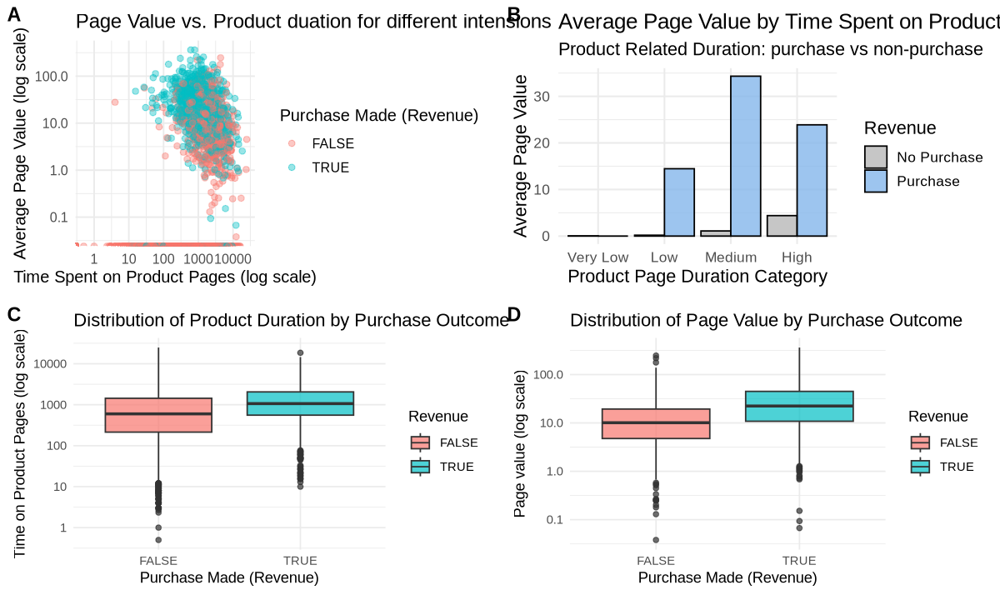

In [5]:
options(repr.plot.width = 10, repr.plot.height = 6)
# Visualization: relationship among PageValues, ProductRelated_Duration, and Revenue
p1<- ggplot(OSPI_clean , aes(x = ProductRelated_Duration,
                 y = PageValues,
                 color = Revenue)) +
  geom_point(alpha = 0.4, size = 1.8)+
  scale_x_log10() +
  scale_y_log10() +
  labs(
    title = "Page Value vs. Product duation for different intensions",
    x = "Time Spent on Product Pages (log scale)",
    y = "Average Page Value (log scale)",
    color = "Purchase Made (Revenue)"
  ) +
  theme_minimal(base_size = 12)


OSPI2 <- OSPI_clean%>% mutate(
    Duration_Level = cut(
      ProductRelated_Duration,
      breaks = c(0, 10, 100, 1000, max(ProductRelated_Duration, na.rm = TRUE)),
      labels = c("Very Low", "Low", "Medium", "High"),
      include.lowest = TRUE
    )
  )

# Summarize PageValue by Duration bins
summary_df <- OSPI2%>%
  group_by(Duration_Level, Revenue) %>%
  summarise(
    MeanPageValue = mean(PageValues, na.rm = TRUE),
    n = n()
  )
# Plot the histogram (bar chart)
p2 <- ggplot(summary_df, aes(x = Duration_Level, y = MeanPageValue, fill = Revenue)) +
  geom_col(position = "dodge", color = "black", alpha = 0.8) +
  scale_fill_manual(values = c("#B8B8B8", "#84B6EB"), labels = c("No Purchase", "Purchase")) +
  labs(
    title = "Average Page Value by Time Spent on Product Pages",
    subtitle = "Product Related Duration: purchase vs non-purchase",
    x = "Product Page Duration Category",
    y = "Average Page Value",
    fill = "Revenue"
  ) +
  theme_minimal(base_size = 13)

p3 <- ggplot(OSPI_clean, aes(x = Revenue, y = ProductRelated_Duration, fill = Revenue)) +
  geom_boxplot(alpha = 0.7) +
scale_y_log10()+
  labs(title = "Distribution of Product Duration by Purchase Outcome",
       x = "Purchase Made (Revenue)", y = "Time on Product Pages (log scale)") +
  theme_minimal()

p4<-ggplot(OSPI_clean, aes(x = Revenue, y = PageValues, fill = Revenue)) +
  geom_boxplot(alpha = 0.7) +
scale_y_log10()+
  labs(title = "Distribution of Page Value by Purchase Outcome",
       x = "Purchase Made (Revenue)", y = "Page value (log scale)") +
  theme_minimal()

p1 <- p1 + theme(plot.margin = margin(10, 10, 10, 10))
p2 <- p2 + theme(plot.margin = margin(10, 10, 10, 10))
p3 <- p3 + theme(plot.margin = margin(10, 10, 10, 10))
p4 <- p4 + theme(plot.margin = margin(10, 10, 10, 10))
# Create top and bottom rows
top_row <- plot_grid(p1, p2, labels = c("A", "B"), ncol = 2, rel_widths = c(1, 1))
bottom_row <- plot_grid(p3, p4, labels = c("C", "D"), ncol = 2, rel_widths = c(1, 1))

# Combine into a 2x2 layout
first_plot <- plot_grid(
  top_row,
  bottom_row,
  ncol = 1,
  rel_heights = c(1, 1)   # balance top and bottom rows equally
)

first_plot
OSPI_clean %>%
  mutate(PageValue_positive = PageValues > 0) %>%
  count(Revenue, PageValue_positive)

### Figure 1
Figure 1 explores how users’ product-page engagement and page values differ between purchasing and non-purchasing sessions, helping us understand the behavioural variables most relevant for predicting conversions. 

* We apply log scales in panels A, C, and D because both ProductRelated_Duration and PageValues are extremely right-skewed, with many sessions showing very low engagement and a long tail of unusually large values; transforming these axes allows meaningful visualization of the full distribution while preventing the few extreme observations from dominating the plots.
* Across the scatterplot, duration bins, and boxplots, purchasing sessions consistently spend more time on product pages and accumulate much higher page values, and these differences remain visible even after accounting for skew.

Overall, Figure 1 demonstrates strong behavioural separation between revenue outcomes and highlights engagement-based variables as valuable predictors for the final classification model.


`geom_smooth()` using formula = 'y ~ x'


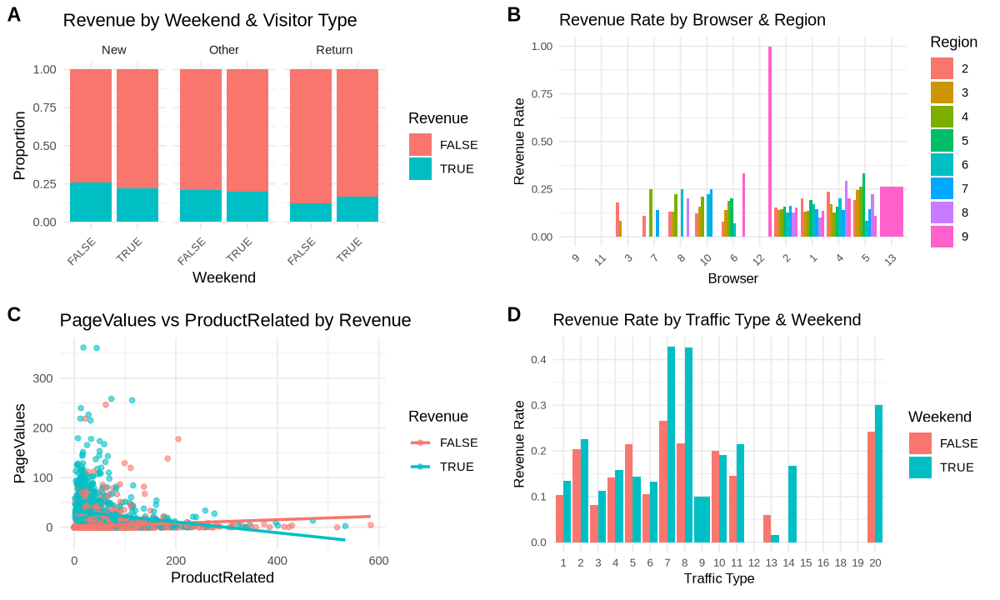

In [6]:
# Plot 1: Revenue by Weekend & Visitor Type
pa <- ggplot(OSPI_clean, aes(x = Weekend, fill = Revenue)) +
geom_bar(position = "fill") +
facet_wrap(~VisitorType,
labeller = labeller(VisitorType = c(
"New_Visitor" = "New",
"Other_Visitor" = "Other",
"Returning_Visitor" = "Return"
))) +
labs(y = "Proportion", title = "Revenue by Weekend & Visitor Type") +
theme_minimal() +
theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 8))

# Plot 2: Revenue by Browser and Region (summary stats)
summary2 <- OSPI_clean %>%
  group_by(Browser, Region) %>%
  summarise(revenue_rate = mean(as.numeric(Revenue) - 1), .groups = "drop")

pb <- ggplot(summary2, aes(x = reorder(Browser, revenue_rate), y = revenue_rate, fill = Region)) +
  geom_col(position = "dodge") +
  labs(y = "Revenue Rate", title = "Revenue Rate by Browser & Region", x = "Browser") +
  theme_minimal() +
  theme(
axis.text.x = element_text(angle = 45, hjust = 1, size = 8), # smaller x-axis labels
axis.text.y = element_text(size = 8), # smaller y-axis labels
axis.title = element_text(size = 10), # smaller axis titles
plot.title = element_text(size = 12) # smaller plot title
)

# Plot 3: PageValues vs ProductRelated color by Revenue
pc <- ggplot(OSPI_clean, aes(x = ProductRelated, y = PageValues, color = Revenue)) +
geom_point(alpha = 0.6) +
geom_smooth(method = "lm", se = FALSE) +
labs(title = "PageValues vs ProductRelated by Revenue") +
theme_minimal()

# Plot 4: Revenue vs Traffic Type and Weekend (summary stats)
summary4 <- OSPI_clean %>%
group_by(TrafficType, Weekend) %>%
summarise(revenue_rate = mean(as.numeric(Revenue) - 1), .groups = "drop")

pd <- ggplot(summary4, aes(x = TrafficType, y = revenue_rate, fill = Weekend)) +
geom_col(position = "dodge") +
labs(y = "Revenue Rate", x = "Traffic Type", title = "Revenue Rate by Traffic Type & Weekend") +
theme_minimal() +
theme(
axis.text.x = element_text(size = 8),
axis.text.y = element_text(size = 8),
axis.title = element_text(size = 10),
plot.title = element_text(size = 12)
)

options(repr.plot.width = 10, repr.plot.height = 6)
pa <- pa + theme(plot.margin = margin(10, 10, 10, 10))
pb <- pb + theme(plot.margin = margin(10, 10, 10, 10))
pc <- pc + theme(plot.margin = margin(10, 10, 10, 10))
pd <- pd + theme(plot.margin = margin(10, 10, 10, 10))

# Create top and bottom rows
top_row <- plot_grid(pa, pb, labels = c("A", "B"), ncol = 2, rel_widths = c(1, 1))
bottom_row <- plot_grid(pc, pd, labels = c("C", "D"), ncol = 2, rel_widths = c(1, 1))

# Combine into a 2x2 layout
second_plot <- plot_grid(
  top_row,
  bottom_row,
  ncol = 1,
  rel_heights = c(1, 1)   
)

second_plot

### Figure 2
Figure 2 investigates how contextual and user-level attributes, such as visitor type, weekend behaviour, browser, region, and traffic source, relate to purchase likelihood, complementing the behavioural features shown in Figure 1. 

* In panel A, we visualize the proportion of purchasing vs. non-purchasing sessions across weekend/weekday conditions within each visitor category.
* Panels B and D use summary statistics rather than raw counts: for each Browser–Region combination (panel B) and each TrafficType–Weekend group (panel D), we compute the revenue rate, defined as the mean of the binary revenue indicator, summarizing the probability of purchase in each subgroup.
* Panel C overlays a linear trend on the relationship between product-page engagement and page value, showing that purchasing sessions consistently lie along a steeper positive slope.

Together, these visualizations show that contextual metadata - including visitor history, technical environment, and traffic source - captures meaningful variation in purchase rates and provides additional predictive signal beyond browsing behaviour alone.

### c) Methods: plan


To predict whether a browsing session results in a purchase, we applied a LASSO-regularized logistic regression model to session-level behavioural, temporal, and user/traffic features. The analysis workflow is as follows:

**Data Preparation and Splitting:**

* The cleaned dataset (OSPI_clean) contains one row per session with numeric and categorical features.
* The response variable is Revenue (binary: purchase/no purchase).
* The dataset was split into training (80%) and testing (20%) sets using stratified sampling to preserve the proportion of purchase outcomes.

**Model Choice and Justification:**
* Logistic regression was chosen because the outcome is binary and coefficients are interpretable.
* LASSO regularization (glmnet) was applied to perform variable selection, shrinking less important coefficients to zero.
* 10-fold cross-validation was used to select the optimal penalty parameter (lambda) based on AUC, reducing overfitting risk and ensuring robust model performance.

**Variable Selection:**
* Two models were examined: one using lambda.min (minimum cross-validated error) for predictive performance, and one using lambda.1se (largest lambda within one standard error) for parsimony.
* LASSO automatically selects the most predictive variables while excluding redundant or uninformative features.

**Prediction and Threshold Selection:**
* Predicted probabilities were generated on the test set using the model trained with lambda.min.
* The optimal probability threshold for classifying a session as a purchase was chosen using Youden’s index on the ROC curve, balancing sensitivity and specificity.

**Model Assessment:**
* Performance metrics on the test set included:
    * Accuracy and Cohen’s kappa for overall agreement.
    * Sensitivity (true positive rate) and Specificity (true negative rate) to assess class-specific performance.
    * Precision (positive predictive value) to evaluate the correctness of predicted purchases.
* ROC curves and AUC were used to summarize discriminative ability and guide threshold selection.

This approach ensures that the predictive model leverages both behavioural and contextual features, selects the most informative variables, and is rigorously evaluated on held-out data for reliable session-level purchase predictions.

In [7]:
set.seed(123)

# Split into training (80%) and testing (20%)
train_index <- createDataPartition(OSPI_clean$Revenue, p = 0.8, list = FALSE)
train_data <- OSPI_clean[train_index, ]
test_data  <- OSPI_clean[-train_index, ]

# Create model matrices for glmnet (numeric inputs)
x_train <- model.matrix(
  Revenue ~ .,
  data = train_data
)[, -1]

x_test <- model.matrix(
  Revenue ~ .,
  data = test_data
)[, -1]

y_train <- as.numeric(train_data$Revenue) - 1
y_test  <- as.numeric(test_data$Revenue) - 1

[1] 0.03562836

71 x 1 sparse Matrix of class "dgCMatrix"
                                        s1
(Intercept)                  -2.1352666255
Administrative                .           
Administrative_Duration       .           
Informational                 .           
Informational_Duration        .           
ProductRelated                .           
ProductRelated_Duration       0.0000154665
BounceRates                   .           
ExitRates                    -2.0803779657
PageValues                    0.0529494908
SpecialDay0.2                 .           
SpecialDay0.4                 .           
SpecialDay0.6                 .           
SpecialDay0.8                 .           
SpecialDay1                   .           
MonthDec                      .           
MonthFeb                      .           
MonthJul                      .           
MonthJune                     .           
MonthMar                      .           
MonthMay                      .           
MonthNov    

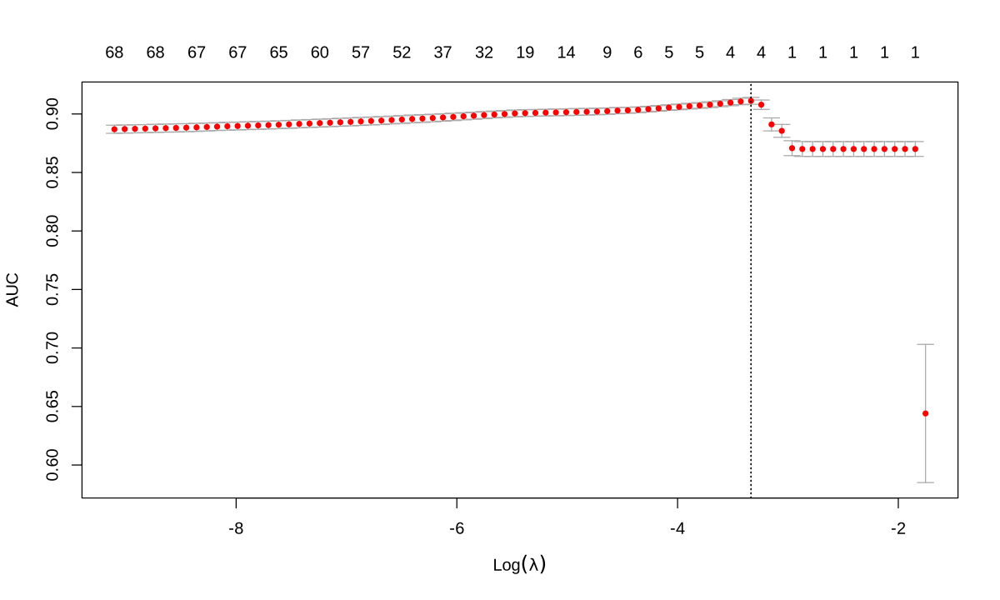

In [8]:
set.seed(123)

cv_lasso <- cv.glmnet(
  x = x_train,
  y = y_train,
  family = "binomial",
  alpha = 1,     
  nfolds = 10,
  type.measure = "auc"
)


plot(cv_lasso)

lambda_min  <- cv_lasso$lambda.min

lambda_min

coef_lasso_min  <- coef(cv_lasso, s = "lambda.min")
coef_lasso_1se  <- coef(cv_lasso, s = "lambda.1se")

coef_lasso_min

p_test_hat <- predict(
  cv_lasso,
  newx = x_test,
  s = "lambda.min",
  type = "response"
)

In [9]:
roc_obj <- roc(response = y_test, predictor = as.numeric(p_test_hat))

best_coords <- coords(
  roc_obj,
  x = "best",
  best.method = "youden",
  transpose = TRUE
)
 
best_thresh <- best_coords["threshold"]
best_thresh

Setting levels: control = 0, case = 1

Setting direction: controls < cases



threshold 
0.1195171

In [10]:
y_test_factor <- factor(y_test, levels = c(0, 1))
y_pred_best   <- factor(as.numeric(p_test_hat > best_thresh), levels = c(0, 1))

cm <- confusionMatrix(
  data      = y_pred_best,
  reference = y_test_factor,
  positive  = "1"
)

cm 

# Extract metrics
accuracy    <- cm$overall["Accuracy"]
kappa       <- cm$overall["Kappa"]

sensitivity <- cm$byClass["Sensitivity"]      
specificity <- cm$byClass["Specificity"]   
precision   <- cm$byClass["Pos Pred Value"]

accuracy
kappa
precision
sensitivity
specificity

Confusion Matrix and Statistics

          Reference
Prediction    0    1
         0 1133   40
         1  149  187
                                        
               Accuracy : 0.8748        
                 95% CI : (0.857, 0.891)
    No Information Rate : 0.8496        
    P-Value [Acc > NIR] : 0.00291       
                                        
                  Kappa : 0.5908        
                                        
 Mcnemar's Test P-Value : 3.971e-15     
                                        
            Sensitivity : 0.8238        
            Specificity : 0.8838        
         Pos Pred Value : 0.5565        
         Neg Pred Value : 0.9659        
             Prevalence : 0.1504        
         Detection Rate : 0.1239        
   Detection Prevalence : 0.2227        
      Balanced Accuracy : 0.8538        
                                        
       'Positive' Class : 1             
                                        

Accuracy 
0.8747515

Kappa 
0.5908299

Pos Pred Value 
     0.5565476

Sensitivity 
  0.8237885

Specificity 
  0.8837754

Setting levels: control = 0, case = 1

Setting direction: controls < cases



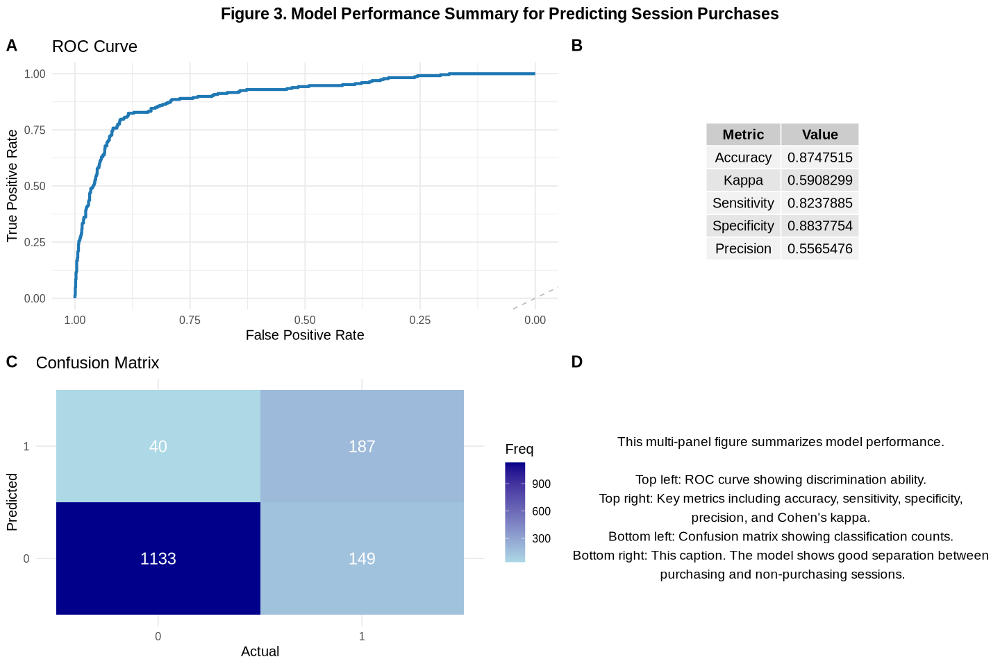

In [11]:
options(repr.plot.width = 12, repr.plot.height = 8)
# --- 1. ROC Curve ---
roc_obj <- roc(y_test, as.numeric(p_test_hat))

p_roc <- ggroc(roc_obj, color = "#1f78b4", size = 1.2) +
  geom_abline(lty = 2, col = "gray") +
  labs(title = "ROC Curve", x = "False Positive Rate", y = "True Positive Rate") +
  theme_minimal(base_size = 12)

# --- 2. Metrics Table ---
metrics_df <- data.frame(
  Metric = c("Accuracy", "Kappa", "Sensitivity", "Specificity", "Precision"),
  Value = c(accuracy, kappa, sensitivity, specificity, precision)
)
p_metrics <- tableGrob(metrics_df, rows = NULL, theme = ttheme_default(base_size = 12))

# Convert tableGrob to a ggplot object so we can use labels
p_metrics_gg <- as.ggplot(p_metrics)

# --- 3. Confusion Matrix Heatmap ---
cm_df <- as.data.frame(cm$table)
colnames(cm_df) <- c("Reference", "Prediction", "Freq")

p_cm <- ggplot(cm_df, aes(x = Reference, y = Prediction, fill = Freq)) +
  geom_tile() +
  geom_text(aes(label = Freq), color = "white", size = 5) +
  scale_fill_gradient(low = "lightblue", high = "darkblue") +
  labs(title = "Confusion Matrix", x = "Actual", y = "Predicted") +
  theme_minimal(base_size = 12)

# --- 4. Caption / Description ---
caption_text <- "This multi-panel figure summarizes model performance. \n\nTop left: ROC curve showing discrimination ability. \nTop right: Key metrics including accuracy, sensitivity, specificity, \nprecision, and Cohen's kappa. \nBottom left: Confusion matrix showing classification counts. \nBottom right: This caption. The model shows good separation between \npurchasing and non-purchasing sessions."
p_caption <- ggplot() +
  annotate("text", x = 0.5, y = 0.5, label = caption_text, hjust = 0.5, vjust = 0.5, size = 4) +
  theme_void()

# --- Combine into 2x2 layout with panel labels ---
top_row <- plot_grid(p_roc, p_metrics_gg, labels = c("A", "B"), ncol = 2, rel_widths = c(1.3, 1))
bottom_row <- plot_grid(p_cm, p_caption, labels = c("C", "D"), ncol = 2, rel_widths = c(1.3, 1))

combined_plot <- plot_grid(top_row, bottom_row, ncol = 1, rel_heights = c(1, 1))

# --- Add overall figure title ---
final_plot <- ggdraw() +
  draw_label("Figure 3. Model Performance Summary for Predicting Session Purchases", fontface = 'bold', x = 0.5, y = 0.98, hjust = 0.5) +
  draw_plot(combined_plot, x = 0, y = 0, width = 1, height = 0.95)

# Display
final_plot

#### Predictive Performance of the LASSO Logistic Model

On the held-out test set, our final LASSO logistic regression model achieved an **accuracy of 0.87**, correctly classifying about 87% of sessions. This is **significantly better than the no-information rate (NIR) of 0.85** (i.e., always predicting “no purchase”), with a p-value of 0.0029. In other words, the model provides real predictive value beyond simply guessing the majority class.

Because purchase sessions are relatively rare (only about 15% of test sessions have `Revenue = 1`), accuracy alone can be misleading. More informative are the class-specific measures (Figure 3, panel B):

- **Sensitivity (recall for purchasers) = 0.82**  
  The model correctly identifies about **82% of purchase sessions** (187 out of 227 actual purchasers). This is important if our goal is to flag most potential customers for marketing or follow-up.

- **Specificity (for non-purchasers) = 0.88**  
  About **88% of non-purchase sessions** are correctly predicted as non-purchases (1133 out of 1282). Thus, the model does a good job avoiding false alarms on users who are unlikely to buy.

- **Positive predictive value (precision for purchasers) = 0.56**  
  Among all sessions the model predicts as a purchase (`Revenue = 1`), roughly **56% actually end in a purchase** (187 out of 336). So, while the model captures most purchasers (high sensitivity), some of the flagged sessions will still be non-purchasers.

- **Negative predictive value = 0.97**  
  When the model predicts no purchase, it is correct about **97% of the time**, meaning very few purchase sessions are incorrectly labelled as non-purchases.

The **Cohen’s kappa of 0.59** indicates **moderate agreement beyond chance** between the model’s predictions and the true outcomes, which is reasonable given the class imbalance. 

From the LASSO coefficients we see that the model retained a small number of predictive variables: 
* ProductRelated_Duration, PageValues, ExitRates, and certain monthly indicators (e.g., MonthNov).
    * **Positive coefficients** for PageValues and MonthNov suggest **higher likelihood of purchase**, while the **negative coefficient** for ExitRates indicates that sessions ending on high-exit pages are **less likely** to convert.
    *  Many other variables were shrunk to zero, highlighting LASSO’s feature selection property.

The ROC curve (Figure 3, panel A) shows good discrimination between purchase and non-purchase sessions, with the model effectively separating the two classes. The confusion matrix heatmap (Figure 3, panel C) illustrates the counts of true and false predictions, confirming the balance between sensitivity and specificity. 

Overall, these results suggest that the model is effective at discriminating between purchase and non-purchase sessions, substantially improving over a naive baseline while maintaining a useful balance between sensitivity and specificity for prediction.


## Discussion

**Main findings and implications**

* The LASSO-penalized logistic model (threshold via Youden’s index) achieves ~0.87 accuracy on the test set, slightly above the 0.85 no-information rate, so it adds real predictive value beyond always predicting “no purchase.”

* With only ~15% purchasers, class metrics are key: sensitivity ≈ 0.82, specificity ≈ 0.88, PPV ≈ 0.56, NPV ≈ 0.97, and Cohen’s κ ≈ 0.59, indicating good discrimination under class imbalance.

* In practice, the model reliably filters out non-buyers while capturing most buyers, making it useful for prioritizing sessions for targeted marketing or interventions.

**Interpretation of key predictors**

* PageValues and ProductRelated_Duration enter with positive coefficients, so deeper engagement with product pages and historically “high-value” pages is associated with higher purchase probability.

* ExitRates has a negative effect, consistent with the idea that sessions ending on common exit pages signal weak purchase intent; timing effects reflect seasonal shopping patterns.

* Because the data are observational, these relationships are associative rather than causal—we cannot claim that changing a single feature would directly change purchase behaviour.

**Were the results expected?**

* The direction and importance of the main predictors align well with e-commerce intuition: more engaged, product-focused sessions → more purchases; exit-heavy sessions → fewer purchases.

* The moderate precision (~0.56) is also expected given the low purchase rate: to catch most purchasers (high sensitivity), the model must accept some false positives.

**Model limitations and potential improvements**

* Performance is based on a single 80/20 train–test split; repeated cross-validation or multiple random splits would give a more stable estimate of out-of-sample performance.

* The model is linear in the log-odds and does not explicitly capture interactions or nonlinear effects; adding interaction/spline terms or using tree-based ensembles could improve fit at the cost of interpretability.

* Misclassification costs were treated as symmetric; cost-sensitive loss functions or threshold choices tailored to business priorities (e.g., prioritizing sensitivity over specificity) could make the model more operationally relevant.

**Future directions and research**

* Deploy the model in a real-time setting to flag high-intent sessions and evaluate targeted interventions (discounts, recommendations) using controlled A/B experiments.

* Compare performance across regions, devices, and traffic sources to identify where predictions are most reliable and which channels bring in the highest-intent users.

* Explore sequence-based clickstream models (e.g., incorporating the order of pages visited) to capture richer behavioural patterns and potentially boost purchase prediction further.


## References

Chen, X. (2025). Consumer online shopping behavior prediction based on machine learning algorithm. *Procedia Computer Science, 262*, 1395–1401. https://doi.org/10.1016/j.procs.2025.05.187

Ding, A. W., Li, S., & Chatterjee, P. (2015). Learning user real-time intent for optimal dynamic web page transformation. *Information Systems Research, 26*(2), 339–359. https://doi.org/10.1287/isre.2015.0568

Moe, W. W. (2003). Buying, searching, or browsing: Differentiating between online shoppers using in-store navigational clickstream. *Journal of Consumer Psychology, 13*(1–2), 29–39. https://doi.org/10.1207/S15327663JCP13-1&2_03

Narvekar, M., & Banu, S. S. (2015). Predicting user's web navigation behavior using hybrid approach. *Procedia Computer Science, 45*, 3–12. https://doi.org/10.1016/j.procs.2015.03.073

Rajamma, R. K., Paswan, A. K., & Hossain, M. M. (2009). Why do shoppers abandon shopping cart? Perceived waiting time, risk, and transaction inconvenience. *Journal of Product & Brand Management*, 18(3), 188-197. https://doi.org/10.1108/10610420910957816

Sakar, C. O., Polat, S., Katircioglu, M., & Kastro, Y. (2019). Real-time prediction of online shoppers’ purchasing intention using multilayer perceptron and LSTM recurrent neural networks. *Neural Computing & Applications*. https://doi.org/10.24432/C5F88Q

Satu, M. S., & Islam, S. F. (2023). Modeling online customer purchase intention behavior applying different feature engineering and classification techniques. *Discover Artificial Intelligence, 3*(36). https://doi.org/10.1007/s44163-023-00086-0
